In [1]:
import sys
import numpy as np 
import open3d as o3d
import cumm.tensorview as tv  # CUDA Matrix multiplication library
import spconv   # Sparse convolution library
import pykitti
# plotting library
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
data = pykitti.raw(base_path="kitti",date="2011_09_28",drive="0035")

(-0.5, 1223.5, 369.5, -0.5)

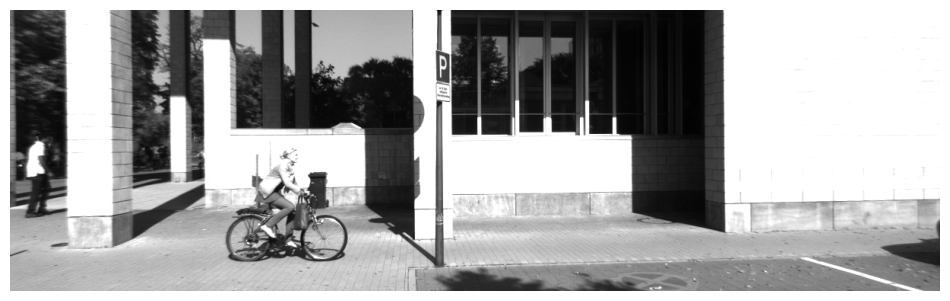

In [15]:
image=data.get_cam0(0)
points=data.get_velo(0)
plt.figure(figsize=(12,6))
plt.imshow(image,cmap='gray')
plt.axis('off')

In [5]:
xyz=np.zeros((points.shape[0],3))
xyz[:,0]=points[:,0]
xyz[:,1]=points[:,1]
xyz[:,2]=points[:,2]
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz)
o3d.io.write_point_cloud("sync.ply", pcd)

True

In [6]:
pcd_load = o3d.io.read_point_cloud("sync.ply")
o3d.visualization.draw_geometries([pcd_load])

In [7]:
vsize_xyz = np.array([0.5, 0.5, 0.5])                  # voxel size in x,y,z 
coors_range_xyz = np.array([0, -40, -3, 70.4, 40, 1])  # KITTI point cloud range
num_point_features = 4                                 # x,y,z, intensity 
max_num_points_per_voxel = 200               
max_num_voxels = 200

In [8]:
from spconv.utils import Point2VoxelCPU3d as VoxelGenerator

voxel_generator = VoxelGenerator(
                vsize_xyz=vsize_xyz,
                coors_range_xyz=coors_range_xyz,
                num_point_features=num_point_features,
                max_num_points_per_voxel=max_num_points_per_voxel,
                max_num_voxels=max_num_voxels
            )

# generate voxels from point cloud data
tv_voxels, tv_voxel_indices, tv_num_points = voxel_generator.point_to_voxel(tv.from_numpy(points))

In [9]:
# make copy with numpy(), since numpy_view() will disappear as soon as the generator is deleted
voxels = tv_voxels.numpy()
voxel_indices = tv_voxel_indices.numpy()
num_points = tv_num_points.numpy()

print(f"voxels.shape = {voxels.shape}")
print(f"voxel_indices.shape = {voxel_indices.shape}")
print(f"num_points.shape = {num_points.shape}")

voxels.shape = (200, 200, 4)
voxel_indices.shape = (200, 3)
num_points.shape = (200,)


In [11]:
# converting grid indices to actual 3D coordinates
# indices give bottom left corner, add half voxel size to get voxel centres
voxelCentres = (voxel_indices[:, ::-1] * vsize_xyz) + (coors_range_xyz[0:3]) + (vsize_xyz * 0.5)

# Changing to [x,y,z,dx,dy,dz,yaw] format to find voxel corners
voxelBBoxes = np.column_stack((voxelCentres, np.repeat( np.append(vsize_xyz, 0.0)[None,:], len(voxel_indices), axis=0)))
print(f"voxelBBoxes.shape = {voxelBBoxes.shape}")

from visual_utils import boxes_to_corners_3d
voxelCorners = boxes_to_corners_3d(voxelBBoxes)
print(f"voxelCorners.shape = {voxelCorners.shape}")

voxelBBoxes.shape = (200, 7)
voxelCorners.shape = (200, 8, 3)


In [12]:
import random
from visual_utils import plot_bboxes_3d

hexadecimal_alphabets = '0123456789ABCDEF'
color = ["#" + ''.join([random.choice(hexadecimal_alphabets) for j in range(6)]) for i in range(voxel_indices.shape[0])]

In [13]:
from visual_utils import plot_pc_data3d,PCD_SCENE, PCD_CAM_VIEW
voxel_generator_plots = [plot_pc_data3d(x=points[:,0], y=points[:,1], z=points[:,2], opacity=0.1, colorscale='viridis')]
voxel_generator_plots.extend(plot_bboxes_3d(voxelCorners, color))
for vox_idx in range(voxel_indices.shape[0]):
    voxel_points = voxels[vox_idx, 0 : num_points[vox_idx], 0:3]
    voxel_generator_plots.append(plot_pc_data3d(x=voxel_points[:,0], y=voxel_points[:,1], z=voxel_points[:,2], \
                                                apply_color_gradient=False, color=color[vox_idx]))
    
layout = dict(scene=PCD_SCENE, scene_camera = PCD_CAM_VIEW, title="VOXEL GENERATOR PLOTS", template="plotly_dark")
fig = go.Figure(data=voxel_generator_plots, layout=layout)
fig.show()  